# HistoMap Tutorial: Mapping Annotations to Spatial Transcriptomics Data

## Introduction

This tutorial demonstrates how to use the HistoMapTx package to analyze spatial transcriptomics data from the 10x Genomics Visium platform. HistoMap is a powerful tool for integrating histological annotations with spatial gene expression data, enabling region-specific analysis of complex tissue samples.

### What is Spatial Transcriptomics?

Spatial transcriptomics allows researchers to measure gene expression while preserving information about the spatial location of cells within a tissue section. The 10x Genomics Visium platform captures gene expression in tissue spots of approximately 55μm diameter, with each spot containing multiple cells.

### Why Use HistoMap?

Histological features such as tumor regions, immune infiltrates, or necrotic areas are often critical for interpreting spatial gene expression data. HistoMap allows you to:

1. Import tissue annotations from pathology tools like QuPath
2. Map these annotations onto Visium spots
3. Integrate histological features with gene expression data
4. Perform region-specific analyses

## Tutorial Overview

In this tutorial, we will:

1. Load a HistoMap object containing spatial transcriptomics data with annotations
2. Visualize and manage tissue annotations
3. Calculate overlap between spots and annotations
4. Generate comprehensive annotation maps
5. Perform differential expression analysis based on annotations
6. Export the processed data for downstream analysis

Let's begin!

## 1. Setting up the Environment

First, let's import the necessary libraries and configure our environment. We'll suppress warnings to keep our notebook clean and focused.

In [1]:
# Suppress warnings for cleaner output
import warnings
warnings.filterwarnings("ignore")

# Import required libraries
import HistoMapTx.histomap as hm  # Main package for annotation integration
import matplotlib.pyplot as plt  # For customizing visualization

# Set plot style and figure size for better visualization
plt.style.use('default')
plt.rcParams['figure.figsize'] = [12, 10]

## 2. Loading the HistoMap Object

We'll start by loading a pre-processed HistoMap object created in a previous tissue detection tutorial. This object contains spatial transcriptomics data that has already been filtered for quality spots.

In [2]:
# Load the pre-processed HistoMap object from a pickle file
histomap = hm.load_histomap("histomap_filtered.pickle")
print(histomap)  # Display a summary of the loaded object

Object loaded from histomap_filtered.pickle
HistoMap Object

--------Annotation--------
📂 Annotation file used: /home/croizer/Téléchargements/QuPath-v0.5.1-Linux/Project1/AO5603_NIP_0085020_final.geojson.gz
📂 Full resolution image used: /home/croizer/Documents/Curie/ressources/4_visium_section/2_HGSOC/2_Run2_Geraldine/VISIUM2/images/AO5603_NIP_0085020.tiff
🔢 Number of annotations present: 6
🏷 Annotations: Necrosis, Negative, Positive, Stroma, Tumor, giant_cells
🏷 Activated annotations: Necrosis, giant_cells, Stroma, Tumor, Negative, Positive
🏷 Disabled annotations: 

-------Spatial Data--------
SpatialData object
├── Images
│     ├── 'AO1124_hires_image': DataArray[cyx] (3, 1970, 2000)
│     └── 'AO1124_lowres_image': DataArray[cyx] (3, 591, 600)
├── Shapes
│     └── 'AO1124': GeoDataFrame shape: (2773, 2) (2D shapes)
└── Tables
      └── 'table': AnnData (2773, 36601)
with coordinate systems:
    ▸ 'downscaled_hires', with elements:
        AO1124_hires_image (Images), AO1124 (Shapes)

### Alternative: Creating a New HistoMap Object

If you prefer to start from scratch without previous tissue filtering, you can create a new HistoMap object by combining QuPath annotations with Visium data. The code below is provided as a reference but is commented out since we're using the pre-filtered data in this tutorial.

In [3]:
# This is alternative code for creating a new HistoMap object from scratch
# Uncomment and modify paths if you want to use your own data

'''
import spatialdata
import spatialdata_io

# Path to your Visium dataset folder (containing the SpaceRanger output)
# Replace with your own path
visium_path = '/path/to/your/visium/data/'

# Load the Visium data using spatialdata_io
visium = spatialdata_io.visium(visium_path, dataset_id='YourSampleID')

# Path to QuPath annotation GeoJSON file
# Replace with your own path
annotation_file = "/path/to/your/annotations.geojson"

# Path to full resolution TIFF image (the one used for annotation and SpaceRanger)
# Replace with your own path
full_res_image = "/path/to/your/image.tiff"

# Create a new HistoMap object
histomap = hm.HistoMap(annotation_file, visium, full_res_image)

# Display information about the HistoMap object
print(histomap)
'''

'\nimport spatialdata\nimport spatialdata_io\n\n# Path to your Visium dataset folder (containing the SpaceRanger output)\n# Replace with your own path\nvisium_path = \'/path/to/your/visium/data/\'\n\n# Load the Visium data using spatialdata_io\nvisium = spatialdata_io.visium(visium_path, dataset_id=\'YourSampleID\')\n\n# Path to QuPath annotation GeoJSON file\n# Replace with your own path\nannotation_file = "/path/to/your/annotations.geojson"\n\n# Path to full resolution TIFF image (the one used for annotation and SpaceRanger)\n# Replace with your own path\nfull_res_image = "/path/to/your/image.tiff"\n\n# Create a new HistoMap object\nhistomap = hm.HistoMap(annotation_file, visium, full_res_image)\n\n# Display information about the HistoMap object\nprint(histomap)\n'

## 3. Visualizing Annotations

Now that we have our HistoMap object loaded, let's first visualize the annotations we've imported from QuPath. This helps us confirm that the annotations are correctly aligned with the tissue and understand the spatial distribution of different tissue regions.

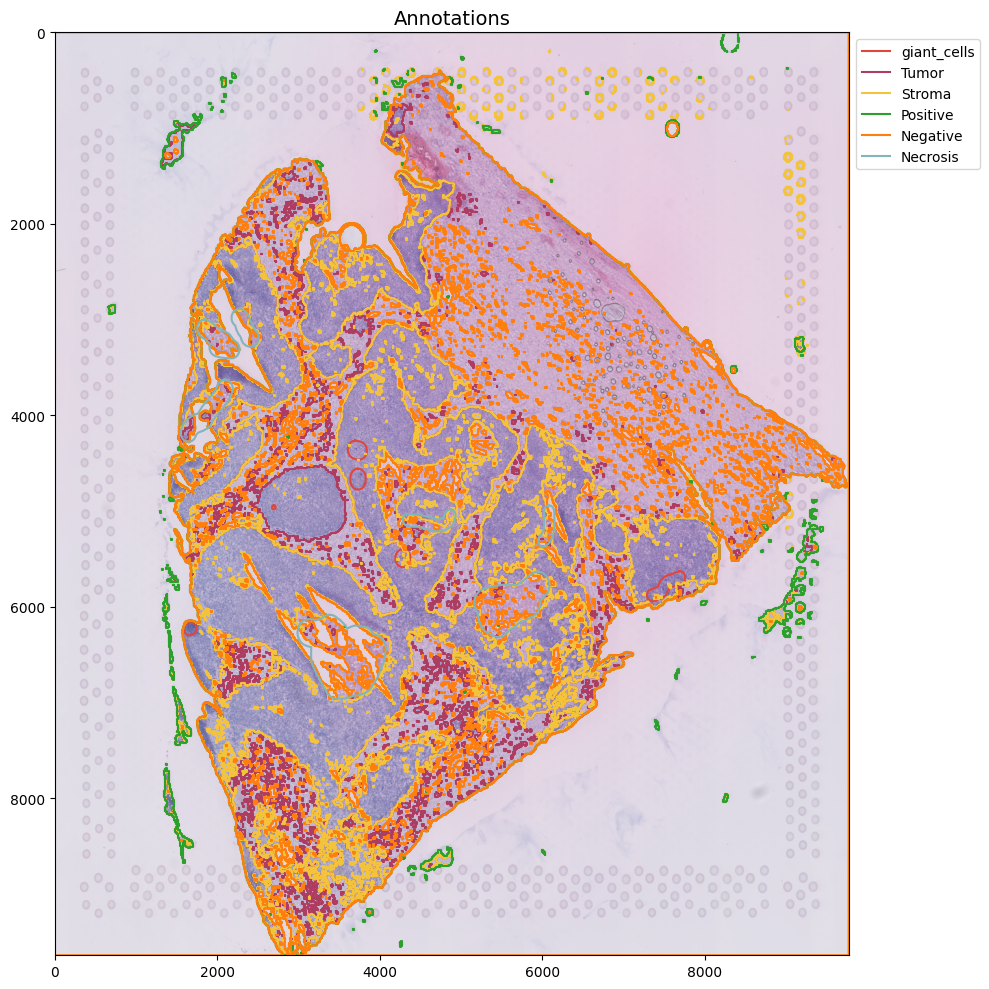

In [4]:
# Plot all annotations on the tissue image
# display_image=True shows the H&E image underneath the annotations
hm.plot_annotations(histomap, display_image=True)

### Visualizing Selected Annotations

We can also focus on specific annotations of interest by specifying them in the `annotation` parameter. This is especially useful when working with complex tissues that have many different annotated regions.

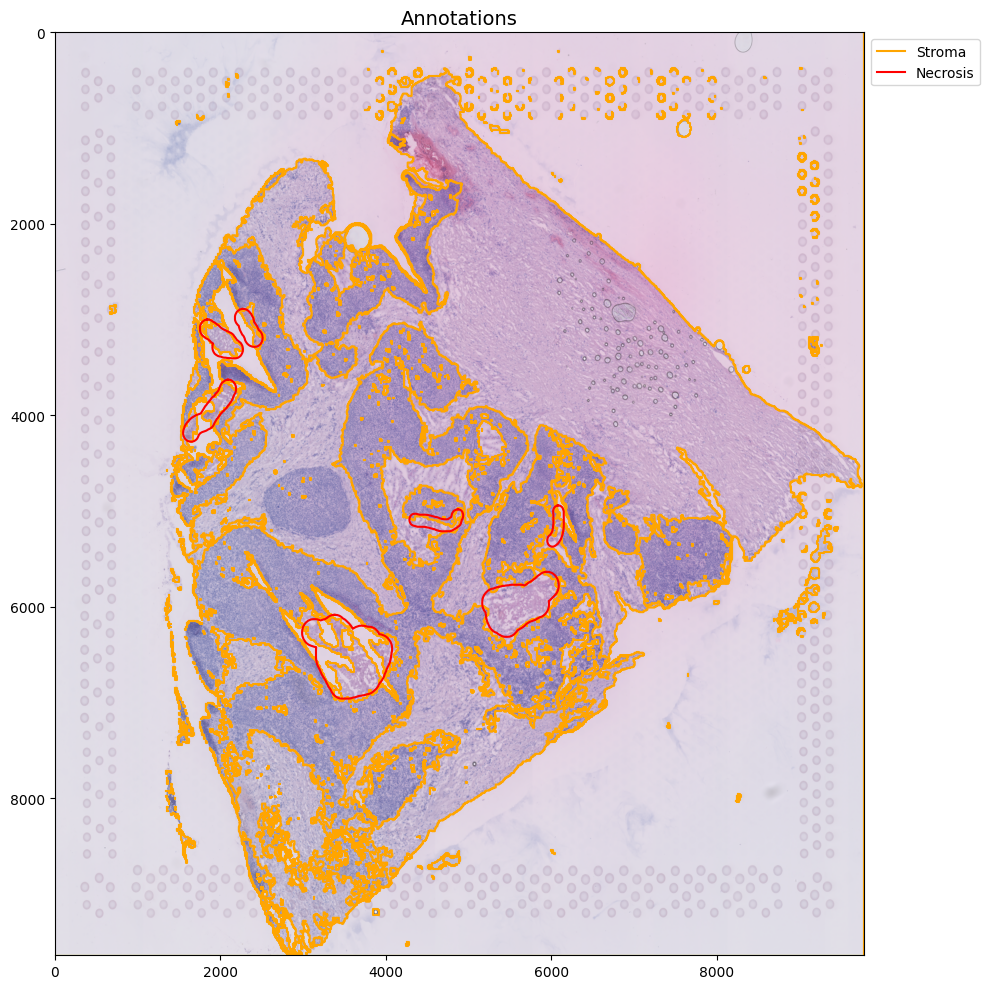

In [5]:
# Plot only 'Necrosis' and 'Stroma' annotations with custom colors
hm.plot_annotations(histomap, 
                   annotation=['Necrosis', 'Stroma'],  # List of annotations to show
                   display_image=True,                # Show H&E background image
                   contour=['red', 'orange'])         # Custom colors for each annotation

### Annotation Properties and Statistics

To better understand our annotations, we can generate a summary that provides key statistics for each annotation category, including total area, perimeter, and the number of components (separate regions) in each category.

In [6]:
# Generate summary statistics for all annotations
annotation_summary = histomap.generate_summary()
annotation_summary  # Display the summary table

,Annotation,total_area,total_perimeter,polygon_count,area_fraction
0,Necrosis,1.518808e+06,12879.016521,7,0.011342
1,Negative,5.679027e+07,437216.000000,2071,0.424091
2,Positive,3.752749e+07,417968.000000,164,0.280243
3,Stroma,2.112634e+07,855328.000000,2142,0.157764
4,Tumor,1.676595e+07,495168.000000,1465,0.125203
5,giant_cells,1.817278e+05,3759.987613,6,0.001357


## 4. Managing Annotations

HistoMap provides powerful tools for managing annotations. The order and selection of annotations can significantly impact your analysis results, so understanding these controls is essential.

### 4.1 Examining the Current Annotation Order

First, let's check the current order of our annotations. In HistoMap, annotations are processed in a specific order, which affects how they overlap and interact.

In [7]:
# Display the current plotting order of annotations
histomap.display_plot_order()

Current Plot Order:


,Annotation,plot_order
0,Necrosis,0
15,Negative,1
16,Positive,2
13,Stroma,3
14,Tumor,4
7,giant_cells,5


### 4.2 Activating and Disabling Annotations

We can selectively enable or disable specific annotations to focus our analysis. In this case, we'll disable the 'Positive' and 'Negative' annotations, which were used for tissue detection in a previous step and are no longer needed.

In [8]:
# Disable the tissue detection annotations as they're no longer needed
histomap.disable_annotation(['Positive', 'Negative'])

Updated activated annotations: ['Necrosis', 'giant_cells', 'Stroma', 'Tumor']
Updated disabled annotations: ['Positive', 'Negative']


Skipping disabled annotations: Positive, Negative


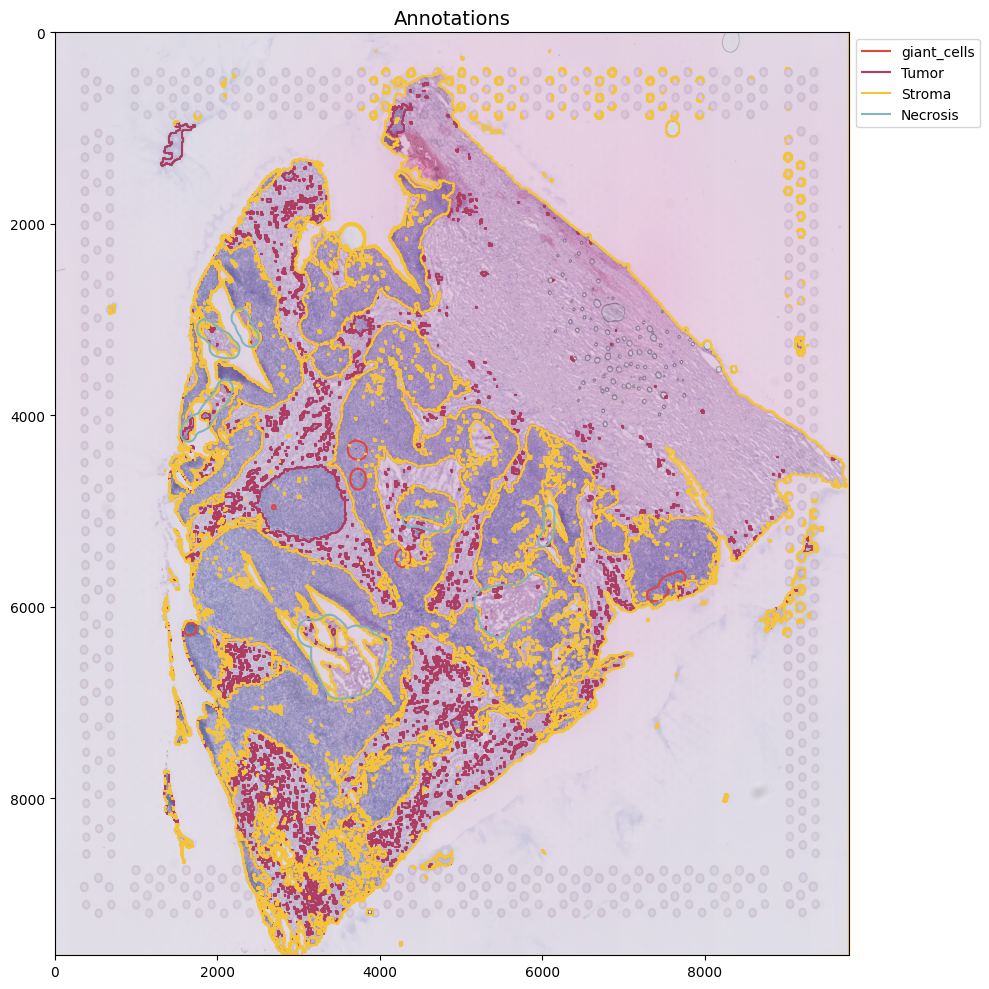

In [9]:
# Visualize the annotations with disabled ones excluded
# fill=False shows only the outlines of annotations
hm.plot_annotations(histomap, display_image=True, fill=False)

### 4.3 Re-enabling Annotations

If needed, we can re-enable annotations that were previously disabled. This is useful if you want to compare different annotation combinations.

In [10]:
# Re-enable the 'Positive' annotation as an example
histomap.activate_annotation('Positive') 

Updated activated annotations: ['Necrosis', 'giant_cells', 'Stroma', 'Tumor', 'Positive']
Updated disabled annotations: ['Negative']


In [11]:
# Revert the change - disable 'Positive' again for our analysis
histomap.disable_annotation('Positive') 

Updated activated annotations: ['Necrosis', 'giant_cells', 'Stroma', 'Tumor']
Updated disabled annotations: ['Positive', 'Negative']


## 5. Computing Annotation Overlap

A key feature of HistoMap is the ability to quantify how much each Visium spot overlaps with different annotation regions. This provides a precise measure of annotation coverage per spot.

### 5.1 Calculating Overlap Percentages

Let's calculate what percentage of each Visium spot overlaps with the 'Stroma' and 'Necrosis' annotations.

In [12]:
# Calculate the percentage overlap between each spot and the specified annotations
histomap.compute_annotation_overlap(['Stroma', 'Necrosis'])

1/2 layer of annotation processed: Necrosis
2/2 layer of annotation processed: Stroma
Updated 'Annotation_positive' for 'Stroma' with threshold 50%.
Updated 'Annotation_positive' for 'Necrosis' with threshold 50%.
Computed annotation overlap for: Stroma, Necrosis. Updated Overlay status.


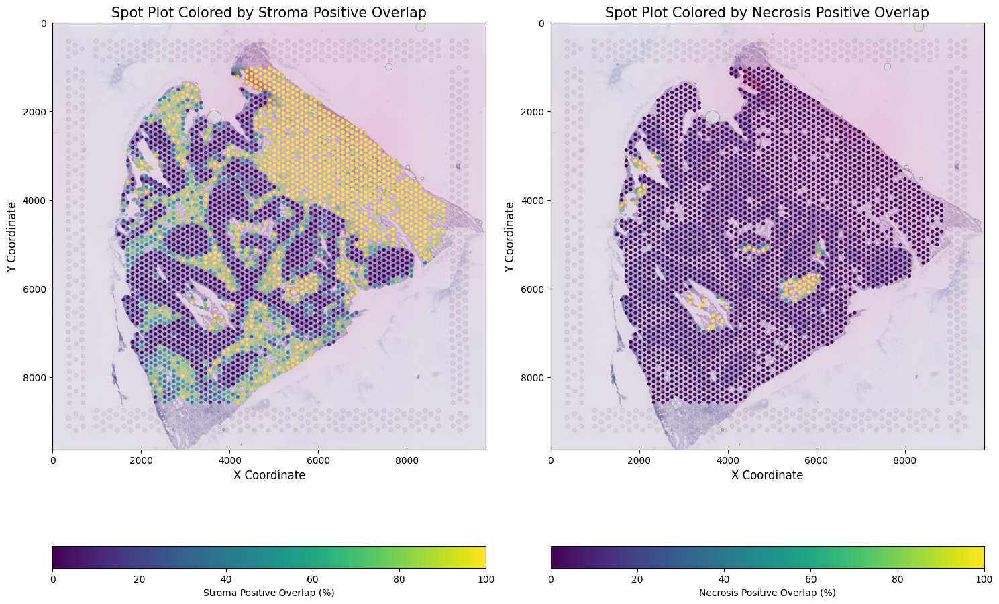

In [13]:
# Visualize the overlap percentages as a heatmap on the tissue
hm.plot_annotation_overlay(histomap, ['Stroma', 'Necrosis'])

### 5.2 Identifying Positive Spots

After calculating overlap percentages, we can identify spots that are "positive" for specific annotations. By default, a spot is considered positive if it has more than 50% coverage by the annotation.

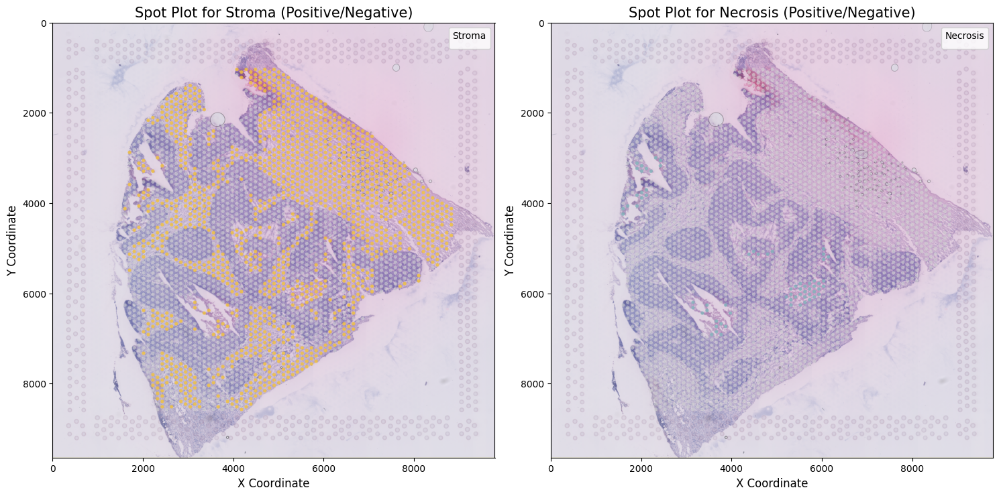

In [14]:
# Visualize spots that are positive for either 'Stroma' or 'Necrosis'
hm.plot_positive_spots(histomap, annotation=['Stroma', 'Necrosis'])

### 5.3 Adjusting Positivity Thresholds

The threshold for determining whether a spot is "positive" for an annotation can be customized. Let's first check the current thresholds.

In [15]:
# Display the current positivity thresholds for all annotations
# The 'Overlay' column indicates whether overlap has been computed
histomap.display_positive_threshold()

,annotation,threshold,Overlay
0,Necrosis,50,True
1,giant_cells,50,False
2,Stroma,50,True
3,Tumor,50,False
4,Negative,50,True
5,Positive,50,True


Now, let's adjust the threshold for the 'Necrosis' annotation. For rare or small features, a lower threshold might be more appropriate.

In [16]:
# Change the positivity threshold for 'Necrosis' from the default 50% to 10%
# This is useful for capturing areas with partial necrosis
histomap.change_positive_threshold(new_threshold={'Necrosis': 10})

Updated 'Annotation_positive' for 'Necrosis' with threshold 10%.


In [17]:
# Verify that the threshold has been updated
histomap.display_positive_threshold()

,annotation,threshold,Overlay
0,Necrosis,10,True
1,giant_cells,50,False
2,Stroma,50,True
3,Tumor,50,False
4,Negative,50,True
5,Positive,50,True


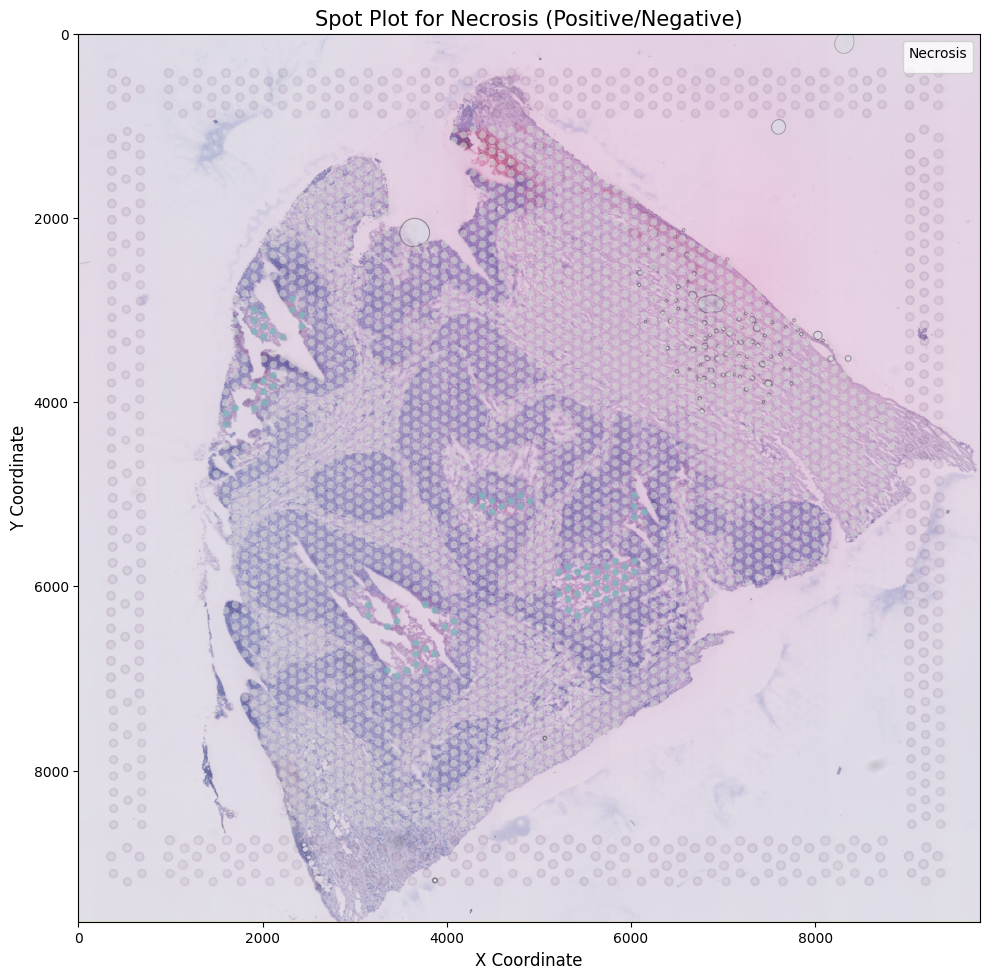

In [18]:
# Visualize 'Necrosis' positive spots with the new lower threshold
# Notice that more spots will be classified as positive now
hm.plot_positive_spots(histomap, annotation='Necrosis')

### 5.4 Computing All Annotation Overlaps

For a comprehensive analysis, we can compute overlaps for all active annotations at once. 

In [19]:
# Calculate overlap percentages for all active annotations
# Note: This might take longer for large or complex annotations
histomap.compute_annotation_overlap('all')

1/4 layer of annotation processed: Necrosis
2/4 layer of annotation processed: Stroma
3/4 layer of annotation processed: Tumor
4/4 layer of annotation processed: giant_cells
Updated 'Annotation_positive' for 'Necrosis' with threshold 10%.
Updated 'Annotation_positive' for 'giant_cells' with threshold 50%.
Updated 'Annotation_positive' for 'Stroma' with threshold 50%.
Updated 'Annotation_positive' for 'Tumor' with threshold 50%.
Computed annotation overlap for: Necrosis, giant_cells, Stroma, Tumor. Updated Overlay status.


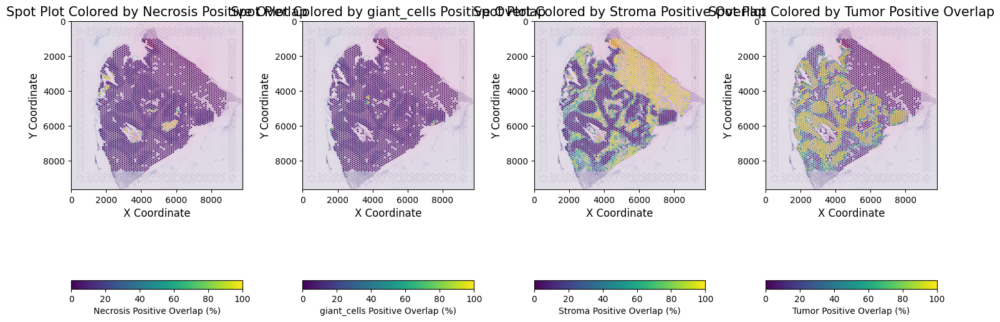

In [20]:
# Visualize overlap for all activated annotations
# histomap.activated_annotations contains the list of all active annotations
hm.plot_annotation_overlay(histomap, histomap.activated_annotations)

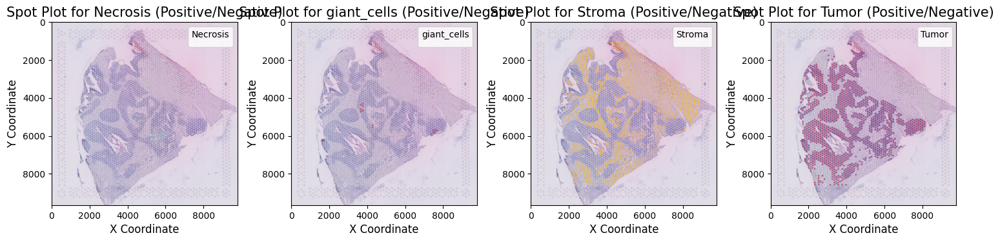

In [21]:
# Visualize positive spots for all active annotations
hm.plot_positive_spots(histomap, histomap.activated_annotations)

### 5.5 Fine-tuning Rare Feature Detection

For very small or rare features like 'giant_cells', we might want to set an extremely low threshold to capture any spot with even minimal overlap.

In [22]:
# Set a very low threshold (1%) for 'giant_cells' to capture any spot with this feature
histomap.change_positive_threshold(new_threshold={'giant_cells': 1})

Updated 'Annotation_positive' for 'giant_cells' with threshold 1%.


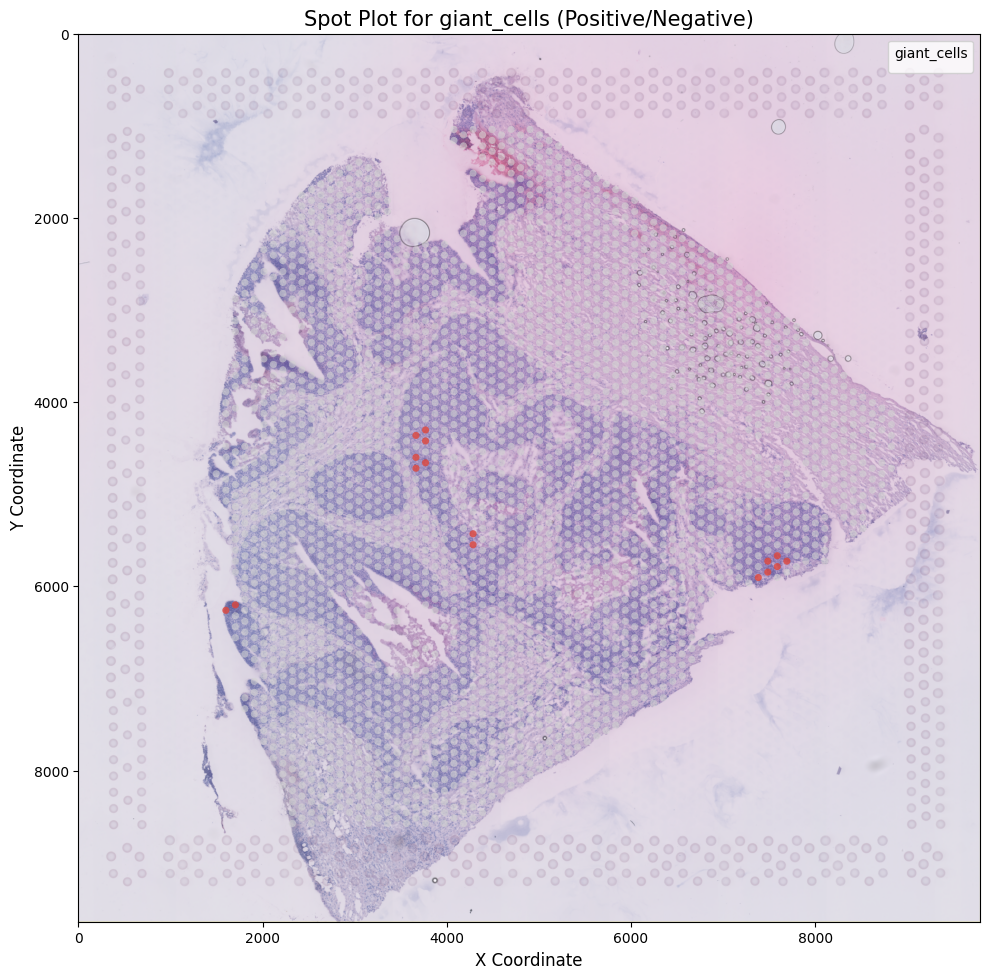

In [24]:
# Visualize spots with any amount of 'giant_cells'
hm.plot_positive_spots(histomap, annotation='giant_cells')

## 6. Working with Layered Annotations

HistoMap treats annotations as layers, which allows for sophisticated handling of overlapping regions. Understanding how these layers work is crucial for generating accurate annotation maps.

### 6.1 Understanding the Annotation Order

Annotations are processed in a specific order, with earlier annotations taking precedence over later ones in overlapping regions. By default, annotations are ordered alphabetically.

In [24]:
# Display the current plotting order of active annotations
histomap.display_plot_order()

Current Plot Order:


,Annotation,plot_order
0,Necrosis,0.0
13,Stroma,1.0
14,Tumor,2.0
7,giant_cells,3.0


### 6.2 Visualizing the Annotation Layer Order

We can visualize the current layer order to better understand how annotations will be applied to spots.

Skipping disabled annotations: Positive, Negative


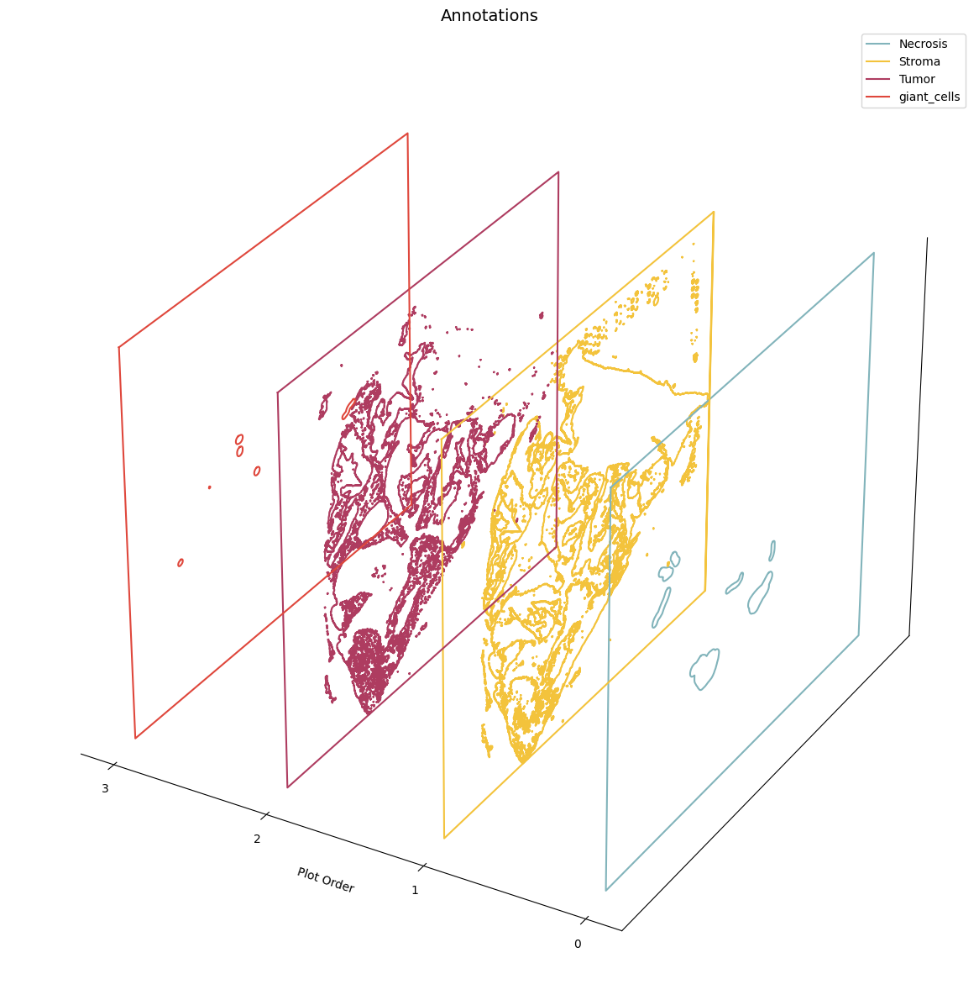

In [25]:
# Plot a diagram showing the current annotation layer order
# Annotations at the top of the diagram take precedence
hm.plot_annotation_order(histomap)

### 6.3 Visualizing Annotations with Current Order

Let's see how the current annotation order affects the visualization.

Skipping disabled annotations: Positive, Negative


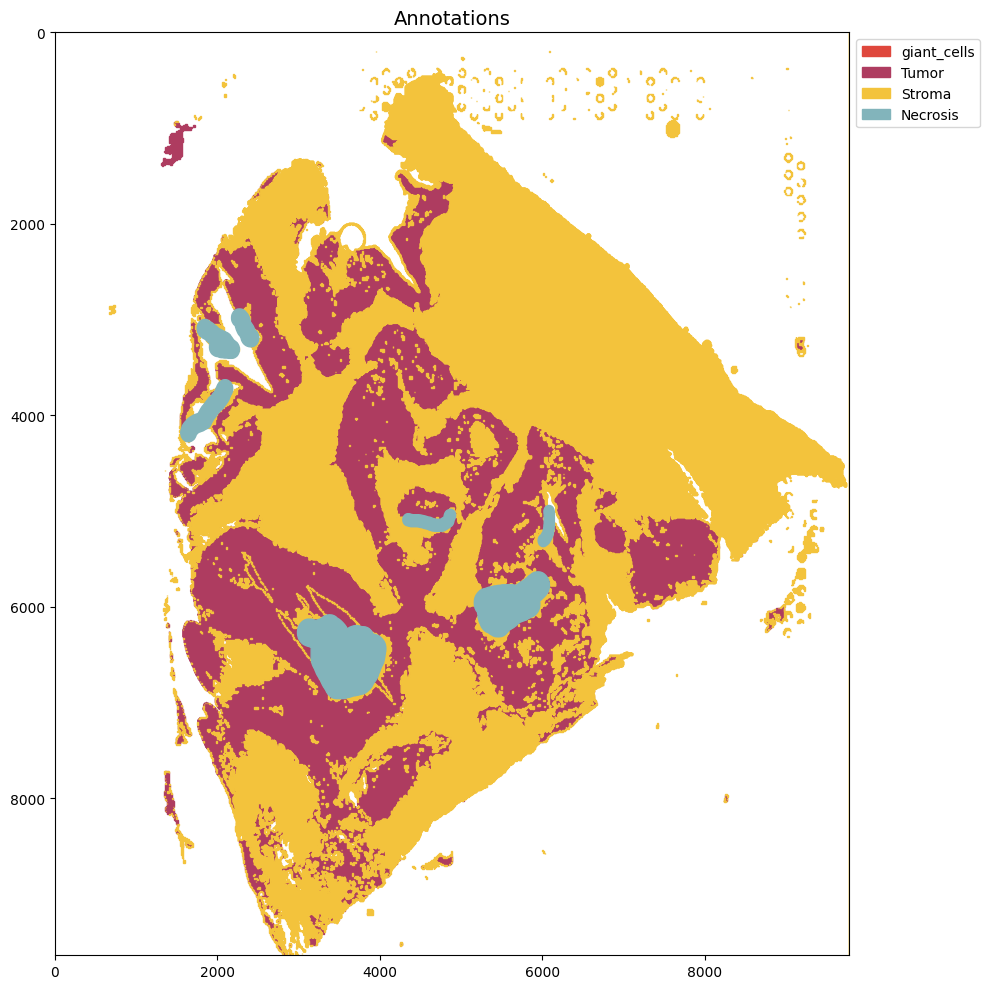

In [26]:
# Plot all annotations with filled colors based on the current order
hm.plot_annotations(histomap, fill=True)

### 6.4 Changing the Annotation Order

The current order might not be optimal. For example, rare features like 'giant_cells' might be obscured by larger annotations like 'Tumor' or 'Stroma'. Let's reorder the annotations to prioritize the features we're most interested in.

In [27]:
# Change the plotting order to prioritize 'giant_cells'
# Earlier annotations in the list take precedence over later ones
histomap.change_plot_order(['giant_cells', 'Necrosis', 'Tumor', 'Stroma'])

Current Plot Order:


In [28]:
# Verify the new plotting order
histomap.display_plot_order()

Current Plot Order:


,Annotation,plot_order
12,giant_cells,0.0
2,Necrosis,1.0
14,Tumor,2.0
13,Stroma,3.0


Skipping disabled annotations: Positive, Negative


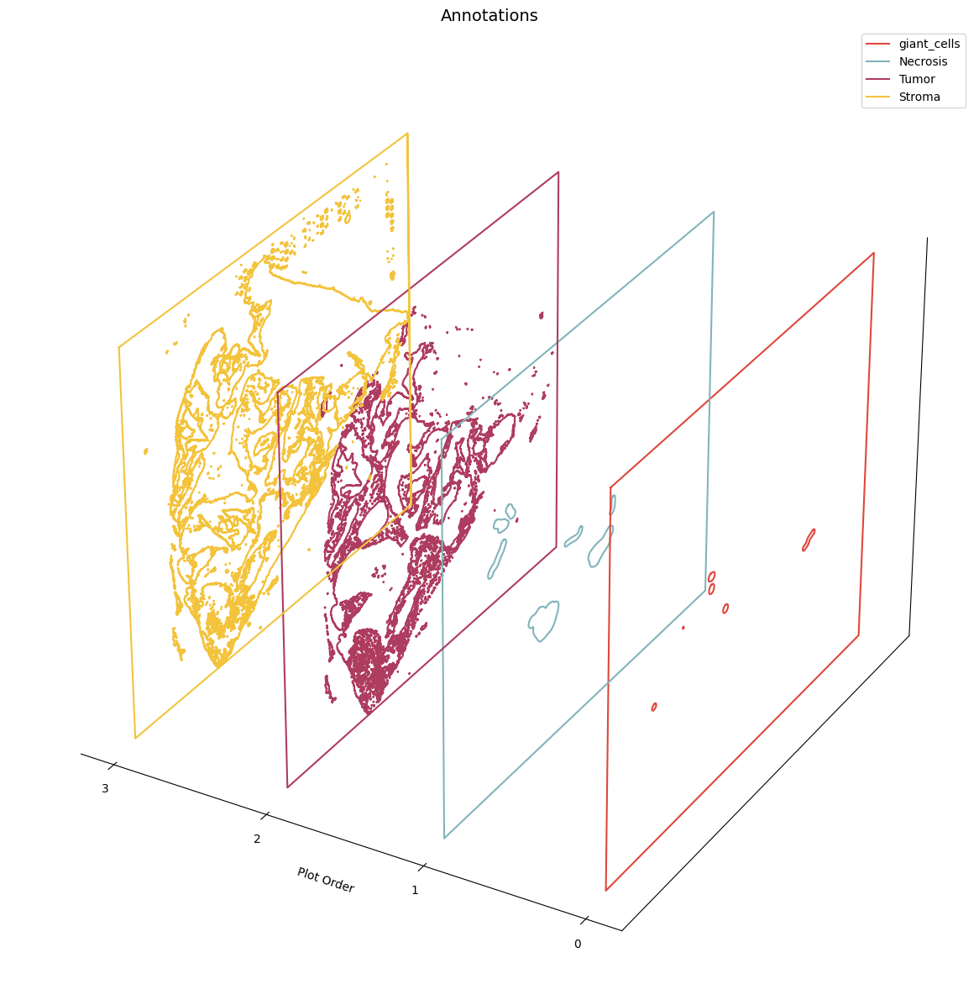

In [29]:
# Visualize the new annotation layer hierarchy
hm.plot_annotation_order(histomap)

Skipping disabled annotations: Positive, Negative


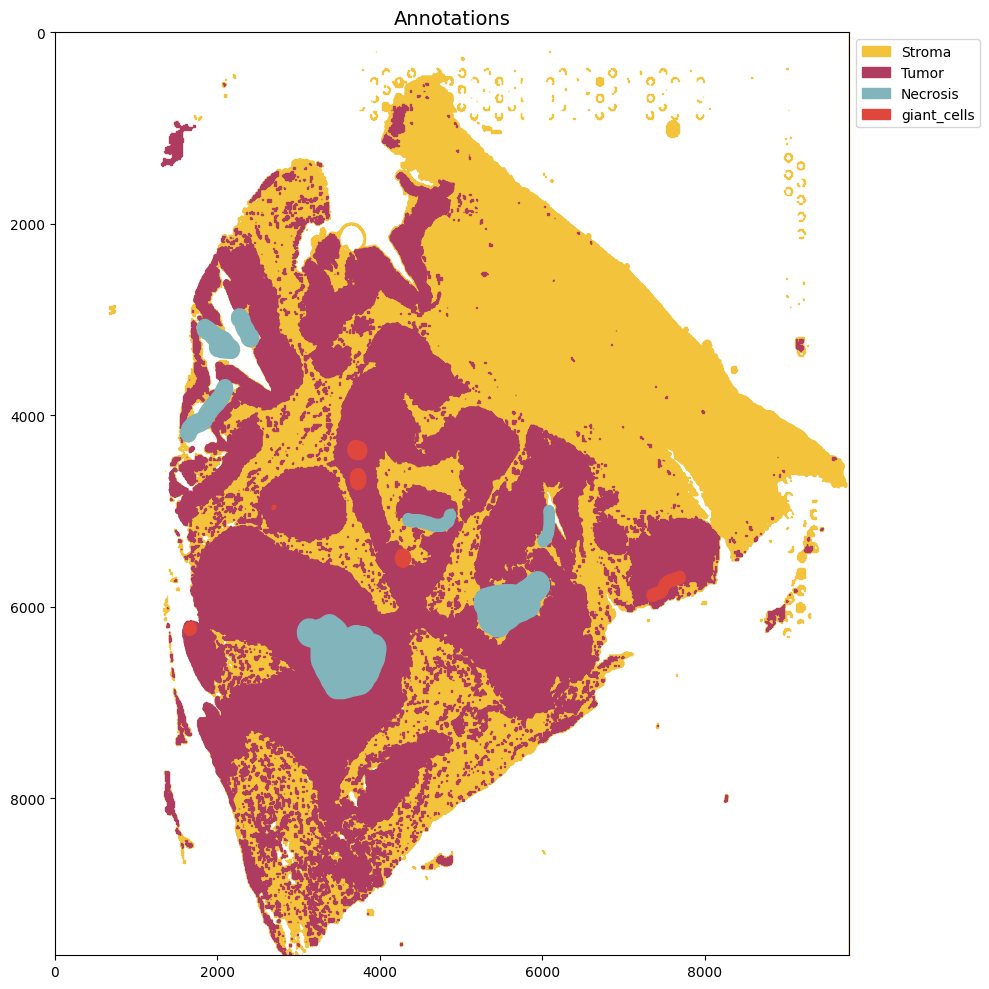

In [30]:
# Plot annotations with the new order
# Note how 'giant_cells' now appears on top of other annotations
hm.plot_annotations(histomap, fill=True)

## 7. Generating the Final Annotation Map

Now that we have set up our annotations, calculated overlaps, and established the correct order, we can generate a comprehensive annotation map that assigns each spot to a specific tissue category.

### 7.1 Creating the Annotation Map

The `generate_annotation_map()` function assigns each spot to a single annotation category based on the overlap percentages and the annotation order.

The `annotate_all` parameter controls how spots with low overlap percentages are handled:
- `annotate_all=True` (default): Spots that don't meet any positivity threshold will be assigned to the annotation with the highest overlap percentage.
- `annotate_all=False`: Spots that don't meet any positivity threshold will be assigned to 'None'.

In [31]:
# Generate the annotation map with default settings
# This assigns each spot to a single annotation category
histomap.generate_annotation_map(annotate_all=True)

Annotating remaining spots with the most overlapping annotation...
Annotation map successfully generated


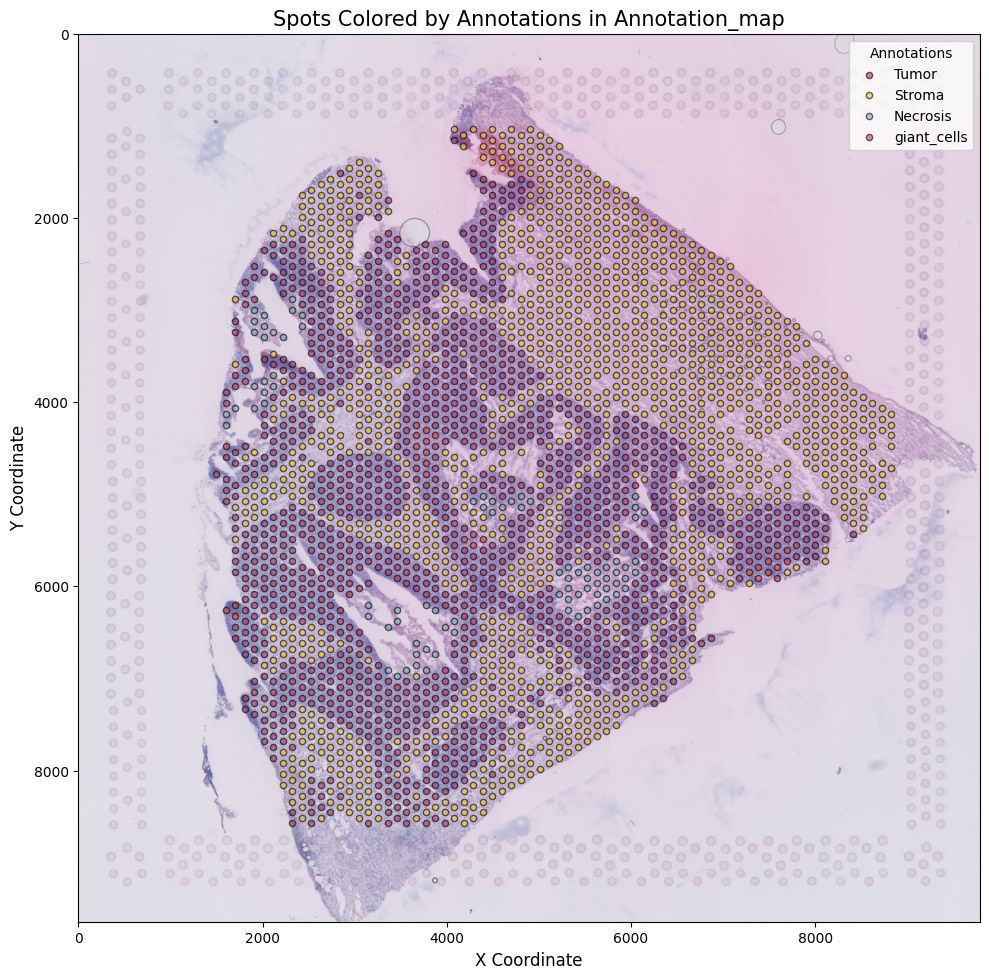

In [32]:
# Visualize the final annotation map
# Each spot is colored according to its assigned annotation
hm.plot_annotation_map(histomap)

And compare with the annotations

Skipping disabled annotations: Positive, Negative


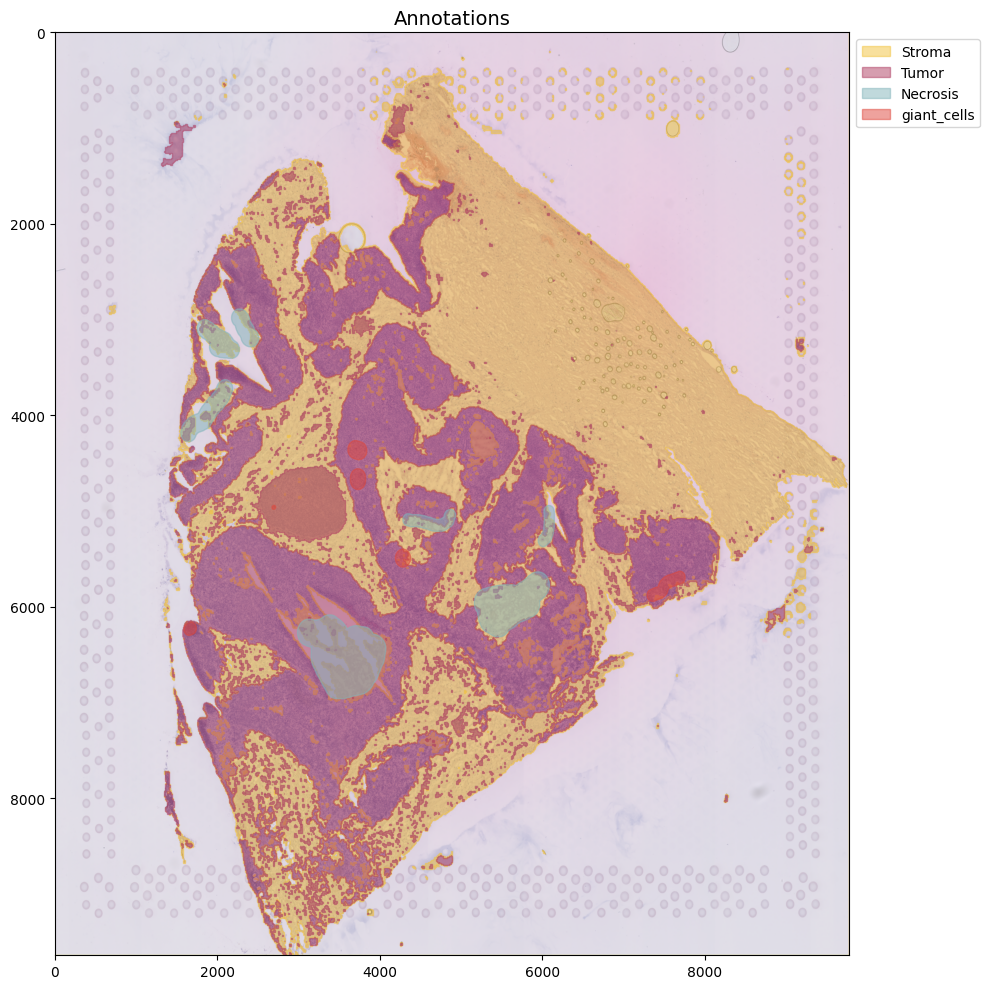

In [33]:
hm.plot_annotations(histomap, fill=True, alpha=0.5, display_image=True)

### 7.2 Understanding the Annotation Map Results

Let's examine the annotation layer order and generate summary statistics to better understand our annotation map.

In [34]:
# Generate summary statistics for all annotations
# This shows area, perimeter, and number of components for each annotation
histomap.generate_summary()

,Annotation,total_area,total_perimeter,polygon_count,area_fraction
0,Necrosis,1.518808e+06,12879.016521,7,0.038361
1,Stroma,2.112634e+07,855328.000000,2142,0.533590
2,Tumor,1.676595e+07,495168.000000,1465,0.423459
3,giant_cells,1.817278e+05,3759.987613,6,0.004590


In [35]:
# Confirm the current plotting order
histomap.display_plot_order()

Current Plot Order:


,Annotation,plot_order
12,giant_cells,0.0
2,Necrosis,1.0
14,Tumor,2.0
13,Stroma,3.0


Annotating remaining spots with the most overlapping annotation...
Annotation map successfully generated


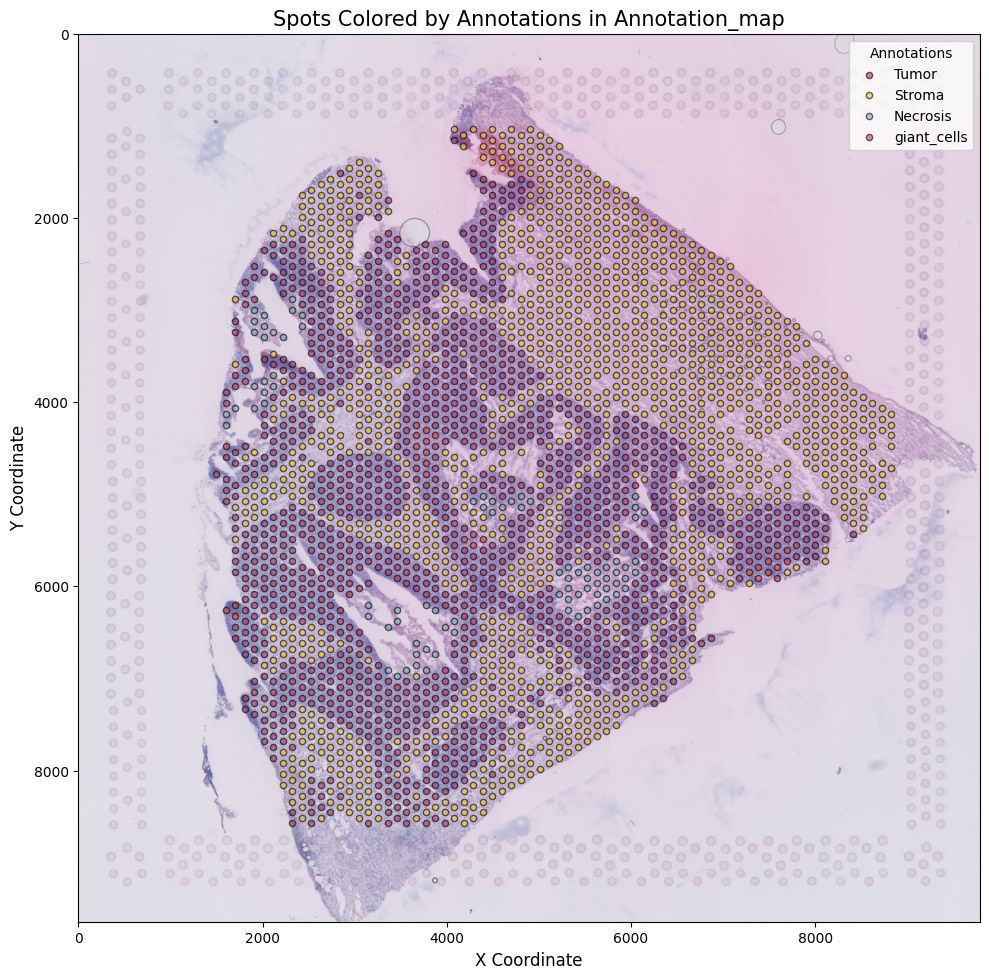

In [36]:
# Regenerate the annotation map and plot it
histomap.generate_annotation_map()
hm.plot_annotation_map(histomap)

### 7.3 Visualizing Annotation Proportions

To get a better sense of the tissue composition, we can visualize the proportion of spots assigned to each annotation category.

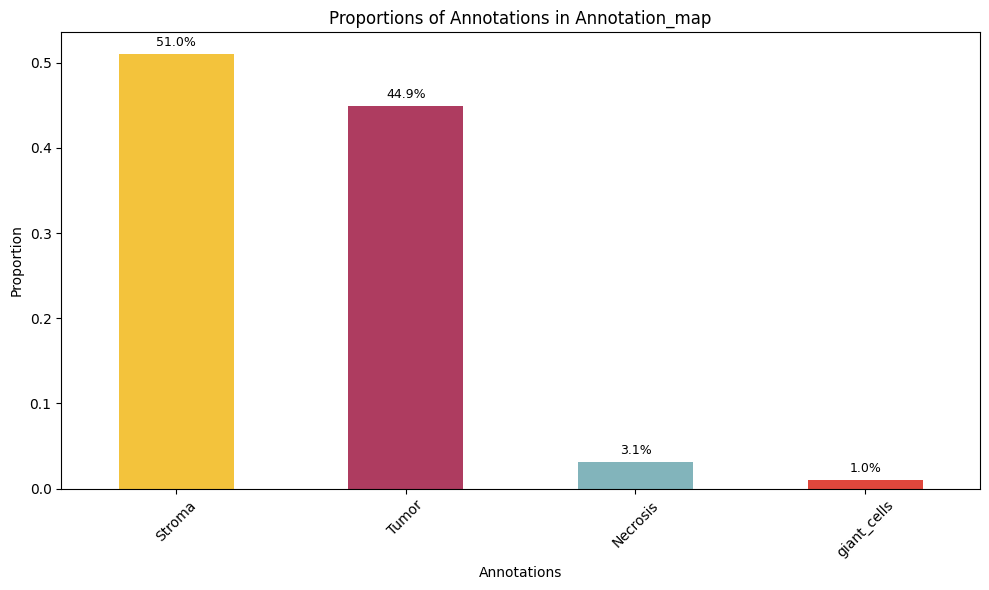

In [37]:
# Plot a bar chart showing the proportion of spots assigned to each annotation
hm.plot_annotation_map_proportions(histomap)

## 8. Differential Expression Analysis Based on Annotations

Now that we have classified each spot into a specific annotation category, we can perform differential expression analysis to identify genes that are up- or down-regulated in different tissue regions.

### 8.1 Converting to AnnData for Scanpy Analysis

First, we'll convert our HistoMap object to an AnnData object, which is the standard format for single-cell analysis in Python using the Scanpy package.

In [38]:
# Convert the HistoMap object to AnnData format
# This includes gene expression data and annotation information
adata = histomap.to_anndata()

In [39]:
# Import Scanpy for single-cell analysis
import scanpy as sc


### 8.2 Preprocessing the Gene Expression Data

Before performing differential expression analysis, we need to preprocess the gene expression data using standard normalization and scaling techniques.

In [40]:
# Normalize each spot to have the same total count
sc.pp.normalize_total(adata)

# Log-transform the data
sc.pp.log1p(adata)

# Scale the data to unit variance and zero mean
sc.pp.scale(adata)

# Identify highly variable genes for dimensionality reduction
sc.pp.highly_variable_genes(adata, n_top_genes=2000)

# Perform principal component analysis (PCA)
sc.tl.pca(adata)

### 8.3 Visualizing Data in PCA Space

Let's visualize how our spots cluster in PCA space, colored by their annotation categories.

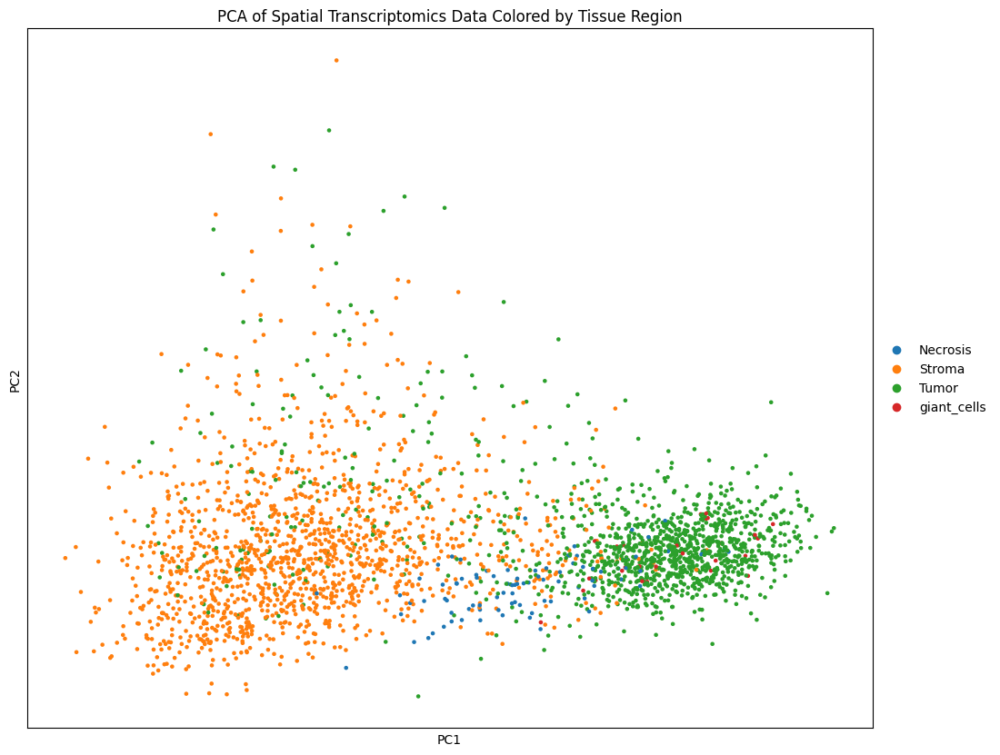

In [41]:
# Plot PCA with spots colored by annotation category
sc.pl.pca(
    adata,
    color=["Annotation_map"],
    title="PCA of Spatial Transcriptomics Data Colored by Tissue Region"
)

### 8.4 Creating a UMAP Visualization

UMAP provides a more detailed visualization of the data structure, potentially revealing finer patterns in gene expression across different tissue regions.

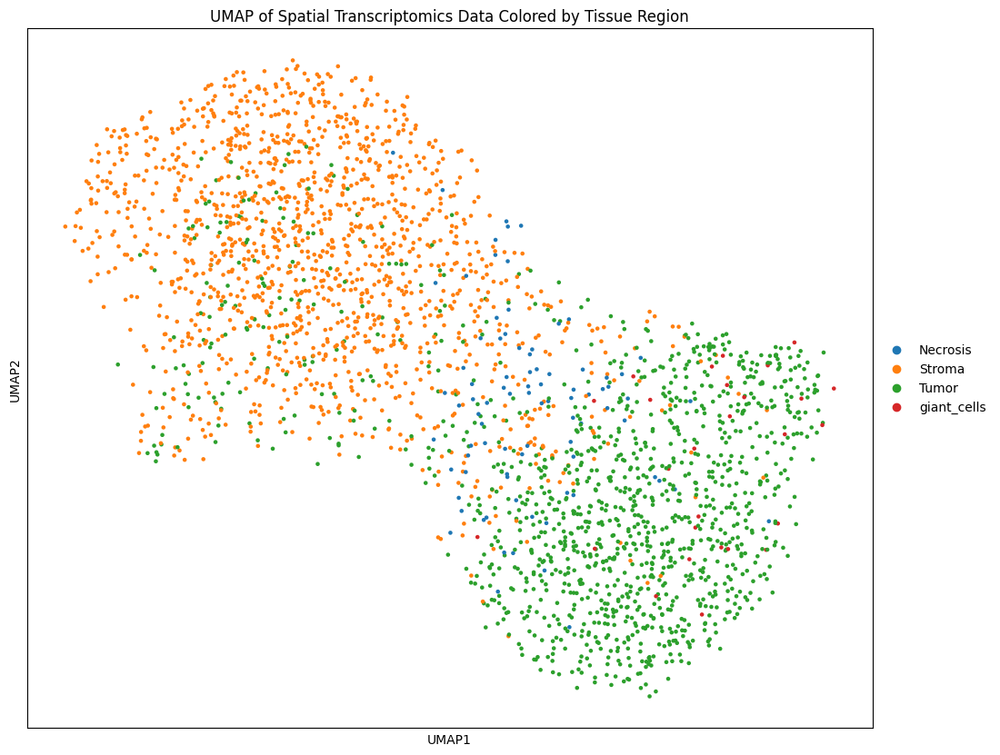

In [42]:
# Compute a neighborhood graph of spots
sc.pp.neighbors(adata)

# Compute UMAP coordinates
sc.tl.umap(adata)

# Plot UMAP with spots colored by annotation category
sc.pl.umap(
    adata,
    color="Annotation_map",
    title="UMAP of Spatial Transcriptomics Data Colored by Tissue Region"
)

### 8.5 Performing Differential Expression Analysis

Now, let's identify genes that are differentially expressed between different tissue regions.

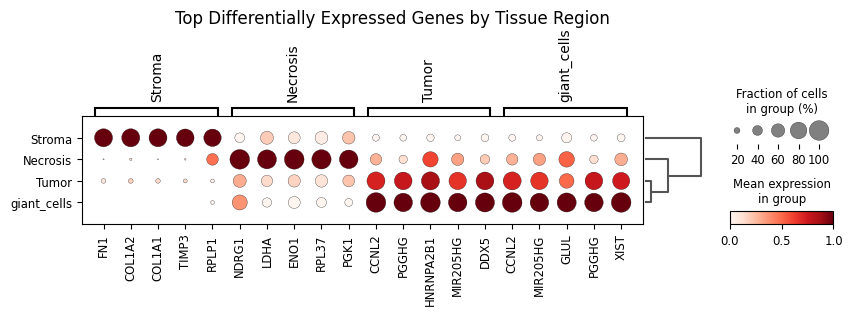

In [43]:
# Perform differential expression analysis using the Wilcoxon rank-sum test
sc.tl.rank_genes_groups(adata, groupby="Annotation_map", method="wilcoxon")

# Visualize the top differentially expressed genes as a dot plot
sc.pl.rank_genes_groups_dotplot(
    adata, 
    groupby="Annotation_map", 
    standard_scale="var", 
    n_genes=5,
    title="Top Differentially Expressed Genes by Tissue Region"
)

## 9. Exporting Data for Downstream Analysis

Finally, let's export our processed data for use in other analysis pipelines or visualization tools.

### 9.1 Exporting as AnnData or SpatialData

These formats are compatible with Python-based spatial transcriptomics analysis tools.

In [44]:
# Export as AnnData object for use with Scanpy
adata = histomap.to_anndata()

# Export as SpatialData object for broader spatial analysis
sdata = histomap.to_spatialdata()

# Optional: Save the AnnData object to a file
# adata.write_h5ad("annotated_spatial_data.h5ad")

### 9.2 Exporting Spot Metadata for R/Seurat

If you prefer to analyze the data in R using Seurat, you can export the spot metadata as a CSV file.

In [45]:
# Export spot metadata as a DataFrame
df = histomap.spot_metadata_to_df()

# Display the first few rows of the metadata
df.head()

# Uncomment to save the metadata to a CSV file
# df.to_csv('./metadata.csv')

,in_tissue,array_row,array_col,spot_id,region,Positive_overlap_x,Positive_positive_x,tissue_detection_x,Negative_overlap_x,Negative_positive_x,...,Negative_positive,Necrosis_overlap_y,Stroma_overlap_y,Stroma_positive_y,Necrosis_positive_y,Tumor_overlap_y,giant_cells_overlap_y,giant_cells_positive_y,Tumor_positive_y,Annotation_map_y
AAACAAGTATCTCCCA-1,1,50,102,0,AO1124,100.000000,True,100.000000,0.000000,False,...,False,0.0,11.392618,False,False,88.607382,0.0,False,True,Tumor
AAACACCAATAACTGC-1,1,59,19,1,AO1124,98.287683,True,96.575366,1.712317,False,...,False,0.0,98.079584,True,False,0.208099,0.0,False,False,Stroma
AAACAGCTTTCAGAAG-1,1,43,9,2,AO1124,99.490667,True,98.981333,0.509333,False,...,False,0.0,48.113547,False,False,51.886453,0.0,False,True,Tumor
AAACATTTCCCGGATT-1,1,61,97,3,AO1124,100.000000,True,100.000000,0.000000,False,...,False,0.0,62.710893,True,False,37.289107,0.0,False,False,Stroma
AAACCCGAACGAAATC-1,1,45,115,4,AO1124,100.000000,True,100.000000,0.000000,False,...,False,0.0,0.000000,False,False,100.000000,0.0,False,True,Tumor


### 9.3 Saving the HistoMap Object

To continue your analysis later or share your processed data with colleagues, you can save the entire HistoMap object.

In [46]:
# Save the HistoMap object to a pickle file
histomap.save("histomap_filtered_annotated.pickle")

Object saved to histomap_filtered_annotated.pickle


## 10. Conclusion

In this tutorial, we've learned how to use HistoMapTx to integrate histological annotations with spatial gene expression data. We've covered:

1. Loading and visualizing annotations
2. Managing annotations through activation/deactivation and ordering
3. Computing and visualizing spot-annotation overlaps
4. Creating comprehensive annotation maps
5. Performing differential gene expression analysis based on tissue regions
6. Exporting the processed data for further analysis

HistoMap provides a powerful framework for region-specific analysis of spatial transcriptomics data, enabling insights into how gene expression varies across different tissue structures and microenvironments.

### Next Steps

With your annotated data, you might consider:

1. Performing pathway enrichment analysis for each tissue region
2. Investigating cell-cell interactions between adjacent regions
3. Correlating gene expression patterns with clinical data
4. Creating interactive visualizations for data exploration

For more information and advanced usage, refer to the HistoMapTx documentation and explore other tutorials in the series.